In [44]:
import os
import scipy
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import multivelo as mv
import matplotlib.pyplot as plt
import matplotlib 
matplotlib.rcParams['figure.dpi'] = 300

adata = sc.read_h5ad("data/10x_mouse_brain/multivelo_result.h5ad")

gene_names = []
for g in adata.var_names:
    gene_names.append(g.upper())
adata.var_names = gene_names

computing velocity graph (using 1/56 cores)


  0%|          | 0/3365 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'velo_s_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
computing velocity embedding
    finished (0:00:00) --> added
    'velo_s_norm_umap', embedded velocity vectors (adata.obsm)


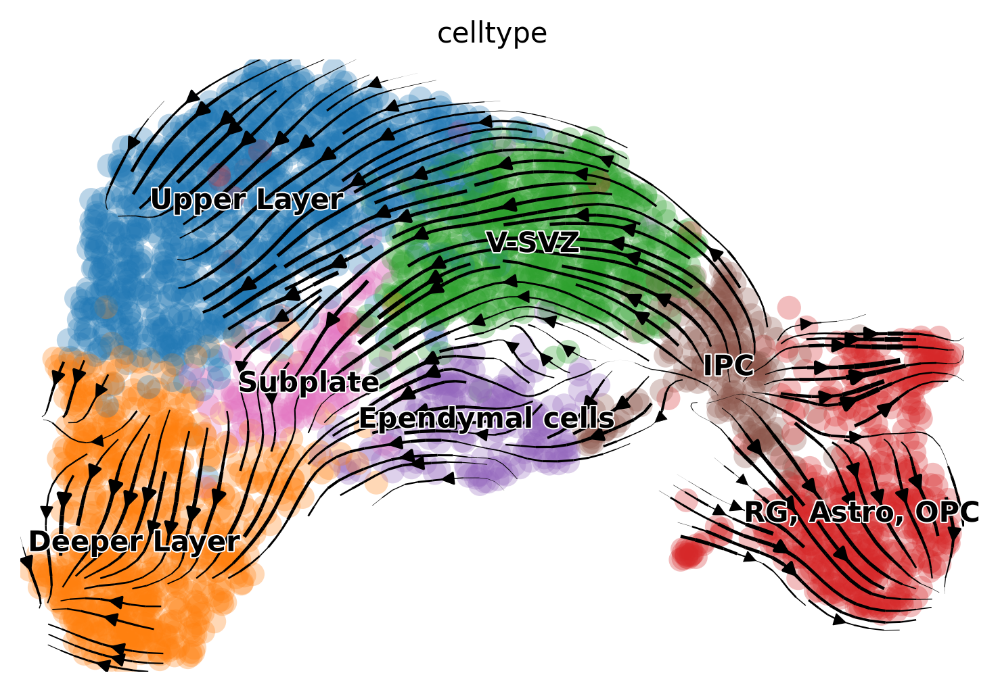

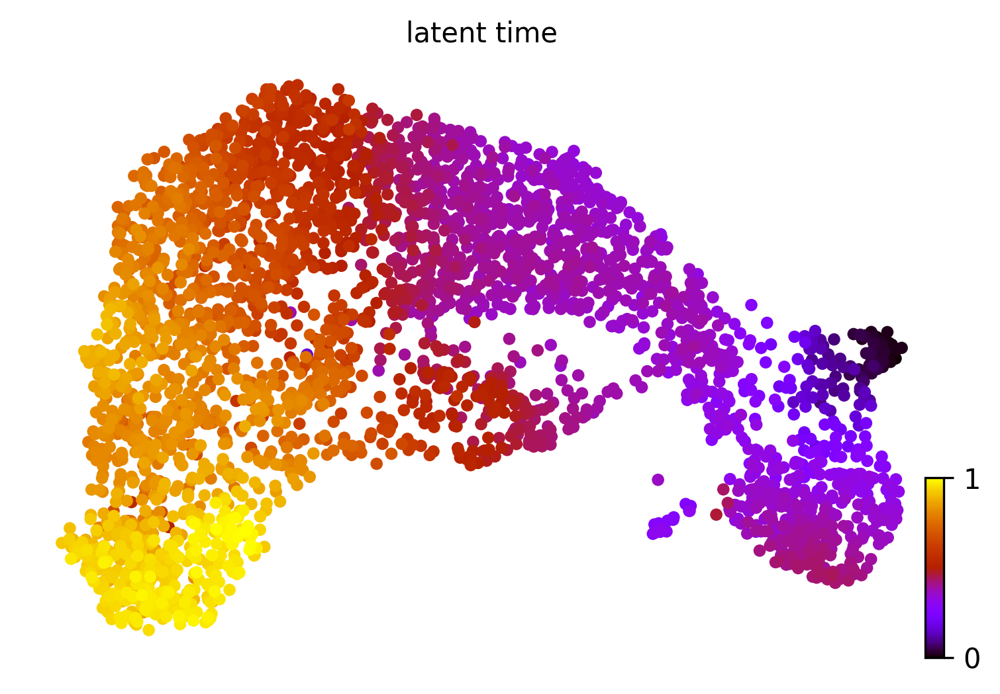

In [45]:
mv.velocity_graph(adata)
mv.latent_time(adata)

mv.velocity_embedding_stream(adata, basis='umap', color='celltype')#, save='multivelo_steam.png')
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)#, save='multivelo_latent_t.png')


In [46]:
# gene_list = ['BMPER', 'ROBO2', 'MEIS2', 'GRIN2B', 'TLE4', 'LGFBPL1', 'TNC', 'EPHA5', 'NFIX']
gene_list = ['AHI1', 'GRIN2B', 'LRRC4C', 'NIN', 'NRCAM', 'NTRK2', 'PTPRD', 'SYT11', 'SYT7']
n_cols=1

In [47]:
#mv.dynamic_plot(adata, gene_list, color_by='state', axis_on=False, frame_on=False)

In [48]:
#mv.dynamic_plot(adata, gene_list, color_by='state', by='velocity', axis_on=False)


In [49]:
#mv.dynamic_plot(adata, gene_list, color_by='celltype', gene_time=False, axis_on=False,)

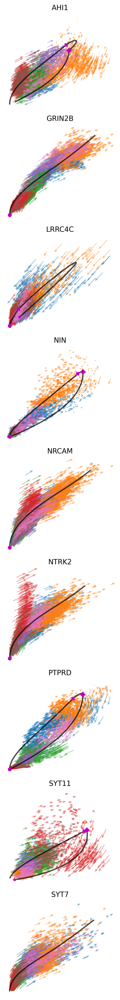

In [50]:
#mv.scatter_plot(adata, gene_list, color_by='celltype', by='us', axis_on=False, frame_on=False, n_cols=n_cols)
mv.scatter_plot(adata, gene_list, color_by='celltype', by='us', axis_on=False, frame_on=False, velocity_arrows=True, n_cols=n_cols)

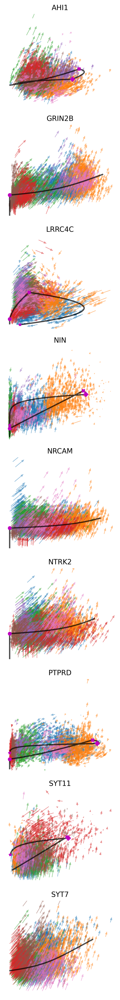

In [51]:
#mv.scatter_plot(adata, gene_list, color_by='celltype', by='cu', axis_on=False, frame_on=False, n_cols=n_cols)
mv.scatter_plot(adata, gene_list, color_by='celltype', by='cu', axis_on=False, frame_on=False, velocity_arrows=True, n_cols=n_cols)

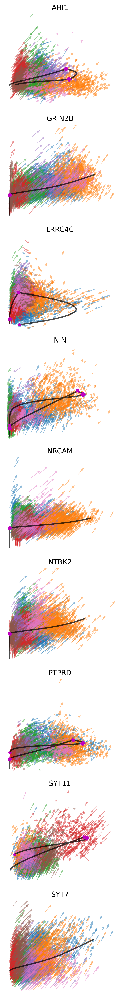

In [52]:
#mv.scatter_plot(adata, gene_list, color_by='celltype', by='cs', axis_on=False, frame_on=False, n_cols=n_cols)
mv.scatter_plot(adata, gene_list, color_by='celltype', by='cs', axis_on=False, frame_on=False, velocity_arrows=True, n_cols=n_cols)

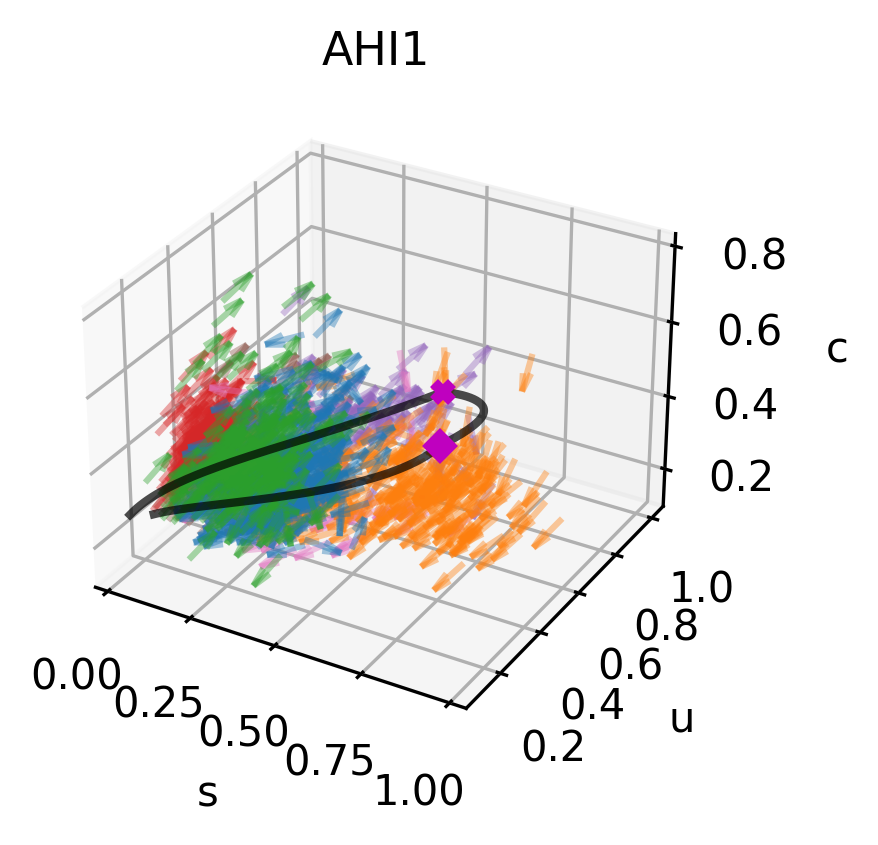

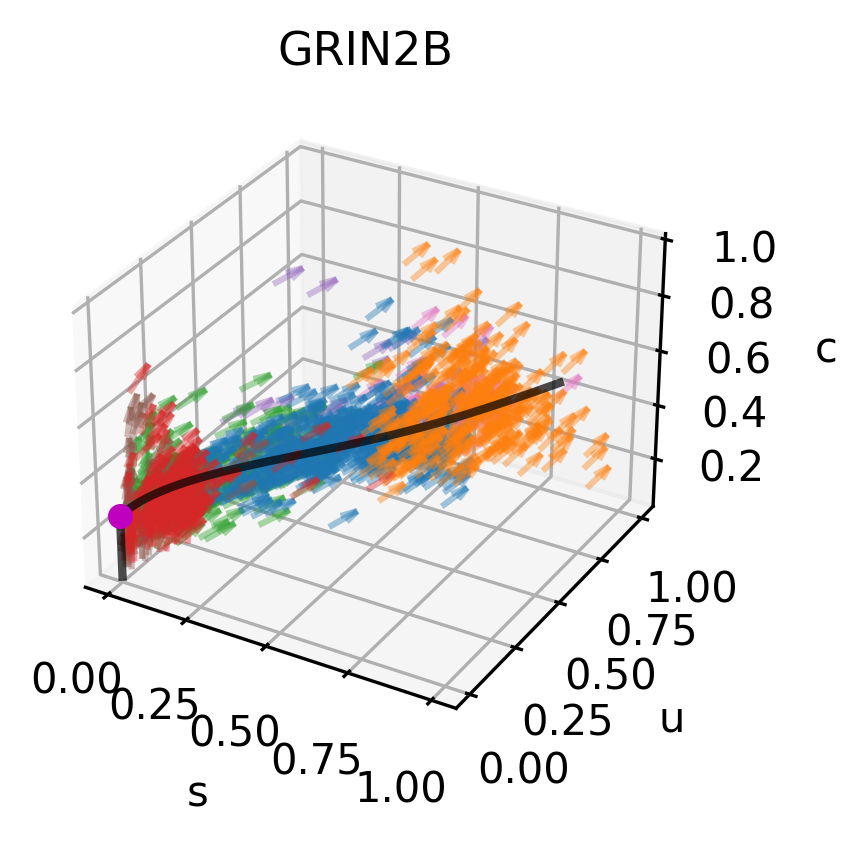

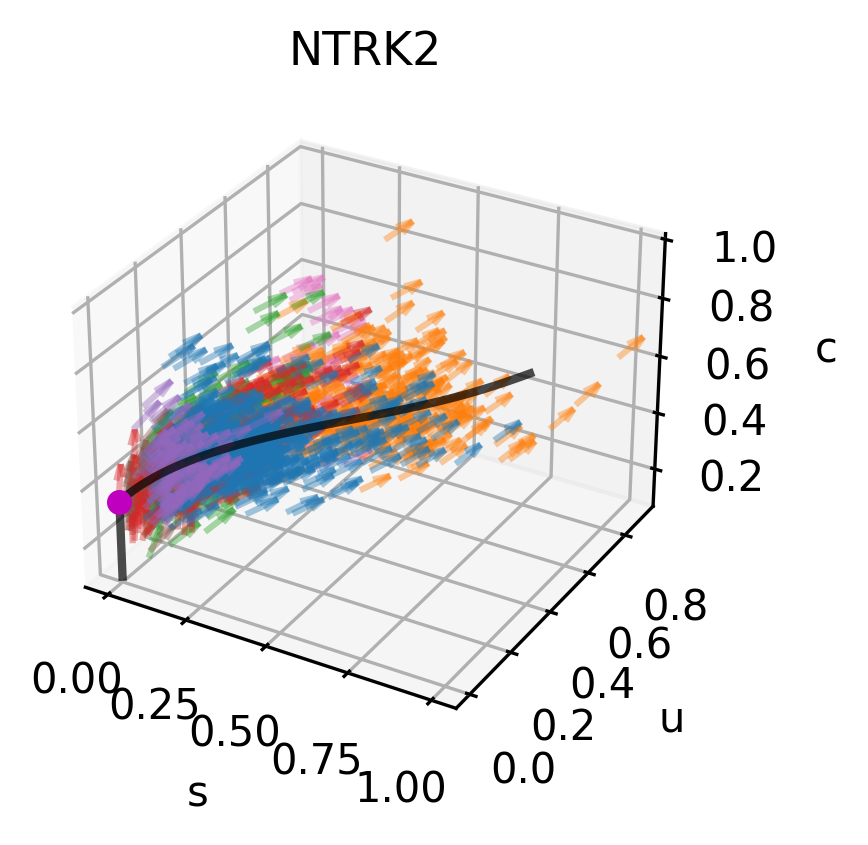

In [55]:
for g in gene_list:
    #mv.scatter_plot(adata, g, color_by='celltype', by='cus', axis_on=False, downsample=2, n_cols=n_cols)
    mv.scatter_plot(adata, g, color_by='celltype', by='cus', downsample=3, velocity_arrows=True, n_cols=n_cols)